In [81]:
# Import librarires
import pandas as pd
import numpy as np
import os
#import seaborn as sns; sns.set(style="white", color_codes=True, rc={'figure.figsize':(20,15)})
import seaborn as sns; sns.set(style="white", color_codes=True)
import matplotlib.pyplot as plt

# Import custom functions
import wget

# Create anndata and scanpy
import anndata as ad
import scanpy as sc
import scanpy.external as sce

sc.set_figure_params(scanpy=True, dpi=180, dpi_save=300, frameon=True, vector_friendly=True, color_map=None, format='pdf', transparent=False, ipython_format='png2x')

## Angioimmunoblastic Cell Lymphoma

In [71]:
# Laptop
#WD = "/Users/aj/Dropbox (Partners HealthCare)/Data/Vignesh_Lymphoma_tma/03252019_Datadump/Angioimmunoblastic Cell Lymphoma"
# HMS
WD = "C:/Users/ajn16/Dropbox (Partners HealthCare)/Data/Vignesh_Lymphoma_tma/03252019_Datadump/Angioimmunoblastic Cell Lymphoma"
os.chdir(WD)

data = pd.read_csv('exp.csv', delimiter=',', index_col=0)
meta = pd.read_csv('meta.csv', delimiter=',',index_col=0)

#Normalize data
# Calculate total count for each cell
sum_data = data.sum(axis=1)
# Divide genes by total count for every cell
data_new = data.div(sum_data, axis=0)
# Calculate median count of the entire dataset
import itertools
from numpy import median
med = median(list(itertools.chain(*data.values.tolist())))
# Multiply by scaling fator (median count of entire dataset)
data_new = data_new*med
# Convert to adata
adata = ad.AnnData(data_new)
# Attach meta data with Anndata
adata.obs = meta
# Covert patient column into string 
adata.obs['patient'] = adata.obs['patient'].astype(str)
adata.obs['core'] = adata.obs['core'].astype(str)
# Log normalize adata
sc.pp.log1p(adata)
# Scale data
y = pd.DataFrame(adata.X)
def scale_by_col(x):
    return x* 10/x.max()
y = y.apply(scale_by_col, axis=0)
# Replace adata 
adata.X = y.values
#sc.pp.scale(adata)

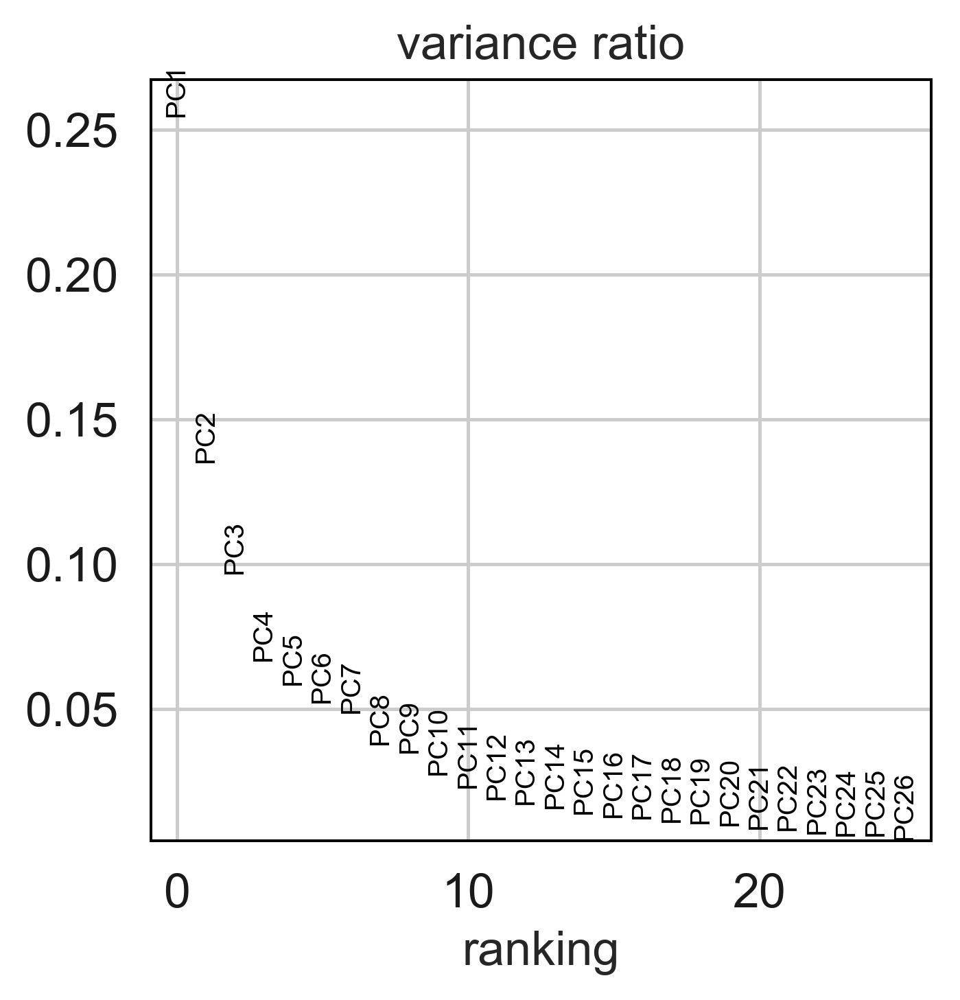

In [72]:
sc.tl.pca(adata, svd_solver='arpack')
sc.pp.neighbors(adata, n_neighbors=30, n_pcs=7)
sc.tl.umap(adata)

saving figure to file ./figures/umap_cluster_heatmap.pdf


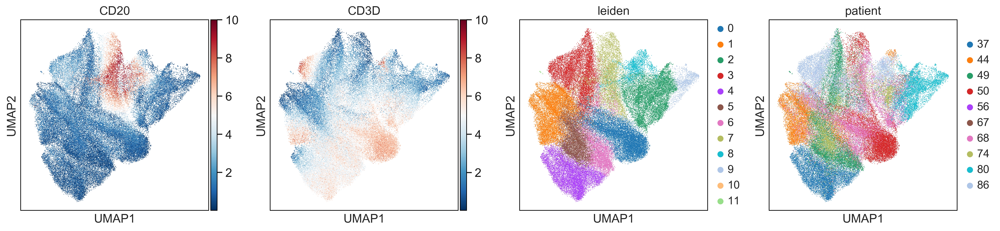

In [127]:
sc.pl.umap(adata, color=['CD20', 'CD3D', 'leiden', 'patient'], color_map="RdBu_r", save = "_cluster_heatmap.pdf")

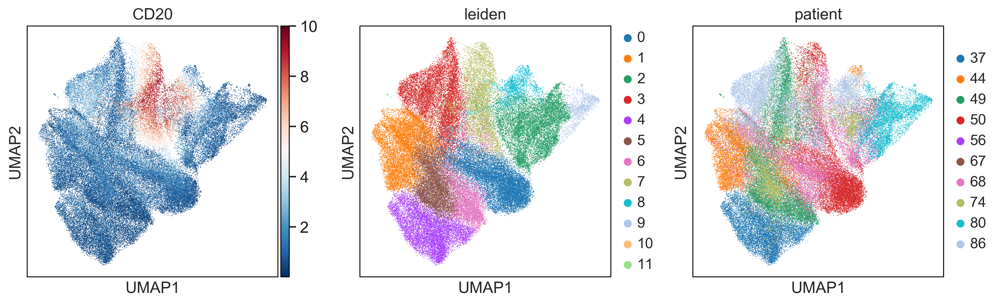

In [85]:
# Clustering and cell type annotation 
sc.tl.leiden(adata, resolution=0.5)
sc.pl.umap(adata, color=['CD20', 'leiden', 'patient'], color_map="RdBu_r")

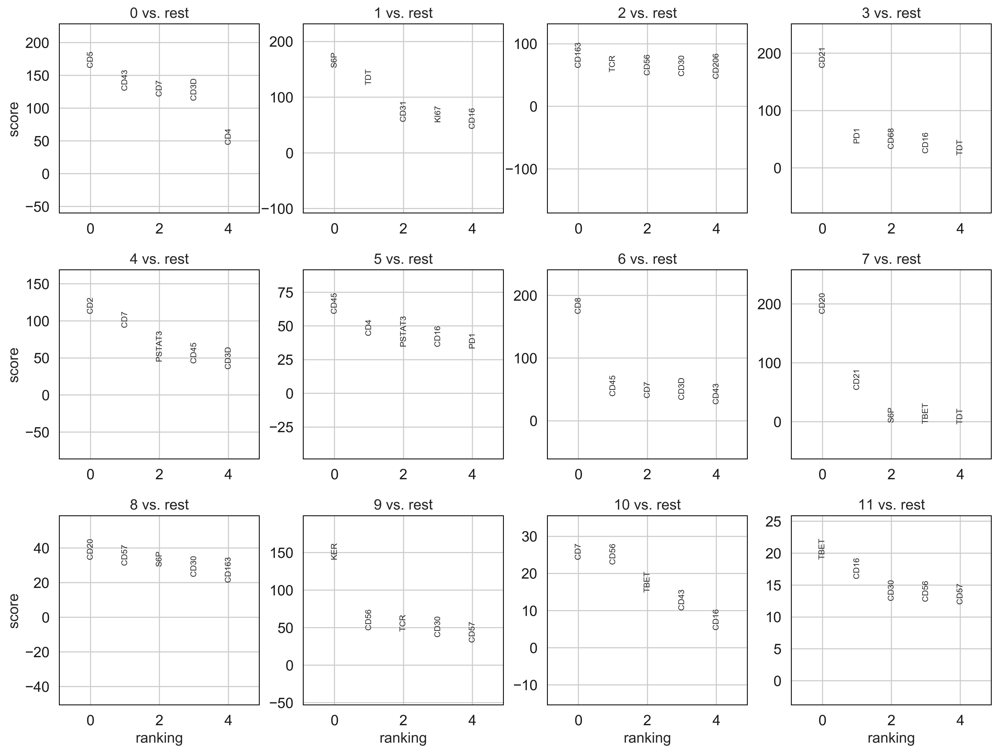

In [87]:
sc.tl.rank_genes_groups(adata, 'leiden', method='t-test_overestim_var')
sc.pl.rank_genes_groups(adata, n_genes=5, sharey=False)

In [115]:
sc.tl.rank_genes_groups(adata, 'leiden', reference=2, method='t-test_overestim_var',  groups='5')
sc.pl.rank_genes_groups(adata, n_genes=5, sharey=False)

TypeError: can only concatenate str (not "list") to str

In [90]:
marker_genes = adata.var.index

In [116]:
marker_genes = ["CD45","TCR","CD3D", "CD4","CD8","CD2","CD5","CD43","CD7", "CD56", "CD20","CD21","CD68","CD163","CD206","PD1","PDL1","KI67","CD57","CD30","KER","S6P","TBET","TDT","CD16","CD31"]

saving figure to file ./figures/matrixplot_cluster_heatmap.pdf


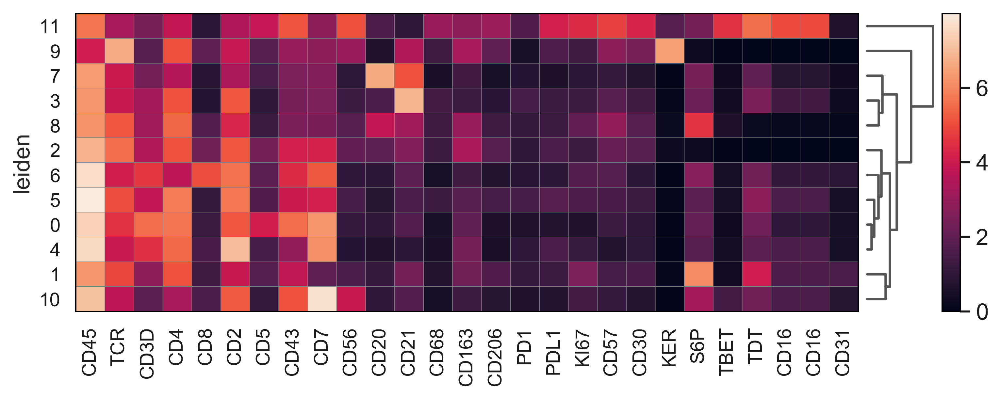

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[8.64, 0.8, 0.2])

In [103]:
sc.pl.matrixplot(adata, marker_genes, groupby='leiden',dendrogram=True,swap_axes=False, save = "_cluster_heatmap.pdf")

In [124]:
# Calculate frequency
table = pd.crosstab(index=adata.obs['leiden'], columns="count")
total_cells = table['count'].sum()
freq_table = table/total_cells * 100

In [125]:
freq_table

col_0,count
leiden,
0,16.626506
1,13.874308
2,13.668512
3,12.827092
4,11.968740
5,9.814393
6,8.494953
7,7.665256
8,2.832953


In [126]:
freq_table['count'].sum()

100.0